# Inter-Annotator Agreement

#### This file generates the all_movies.csv and movies for training from the raw annotated files in the data/ folder, which we use for our models training and testing.

In [2]:
pip install nltk

     ---------------------------------------- 1.5/1.5 MB 669.3 kB/s eta 0:00:00
     -------------------------------------- 98.2/98.2 kB 935.6 kB/s eta 0:00:00
     -------------------------------------- 274.0/274.0 kB 1.2 MB/s eta 0:00:00
     -------------------------------------- 301.8/301.8 kB 1.1 MB/s eta 0:00:00
     ---------------------------------------- 78.5/78.5 kB 1.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import pandas as pd
from collections import Counter
import numpy as np
from nltk import agreement
from os import walk

In [4]:
def create_reduced_df(df):
    result = []
    for index, row in df.iterrows():
        WorkerId = row.WorkerId
        for i in range(1,41):
            text = row['Input.text' + str(i)]
            _id = row['Input.id' + str(i)]
            answer = row['Answer.classification' + str(i)]
            batch_id = row['Input.batch_id']
            result.append({'workerId': WorkerId, 'movie_id':_id, 'batch_id': batch_id, 'text': text, 'answer':answer, 'number' : i})
    df_result = pd.DataFrame(result)
    df_result['answer'].replace({'hatespeech': 2, 'normal': 0, 'offensive': 1}, inplace=True)
    return df_result

In [17]:
path = 'C:\\Users\\hp\\Desktop\\CODES\\hatespeech-main\\data\\Movies\\raw'
_, _, movie_names = next(walk(path))


In [18]:
def load_all_movies(path, movie_names):
    
    df_list = []
    
    for movie in movie_names:
        df = pd.read_csv(path + '/' + movie)
        df = create_reduced_df(df)
        df['movie'] = movie.split('.')[0]
        df_list.append(df)
        
    result_df = pd.concat(df_list)
    result_df = result_df.dropna()
    
    return result_df

In [19]:
df = load_all_movies(path, movie_names)

C:\Users\hp\AppData\Local\Temp\ipykernel_9708\2380546584.py:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_result['answer'].replace({'hatespeech': 2, 'normal': 0, 'offensive': 1}, inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_9708\2380546584.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting',

In [20]:
df.head(1)

,workerId,movie_id,batch_id,text,answer,number,movie
0,AVNP1F3CADQRW,AmericanHistoryX(1998)_1,1566624979,Derek.,0,1,AmerricanHistoryX


In [21]:
len(df.workerId.unique())

13

In [22]:
movie_id_test = []
def get_annotated_movie(df):
    
    result = []
    
    batch_ids = df.batch_id.unique()
    for batch_id in batch_ids:
        movie_ids = df[(df.batch_id==batch_id)].movie_id.unique()
        for movie_id in movie_ids:
            annotation_single = df[(df.batch_id==batch_id) & (df.movie_id==movie_id)]
            
            if len(annotation_single)>0:
                movie_name = annotation_single.movie.values[0]
                majority_answer = Counter(annotation_single.answer.values)
                majority_answer_single = majority_answer.most_common()[0][0]
                
                text = annotation_single.text.values[0]
                
                if majority_answer.most_common()[0][1] == 1:
                    
                    majority_answer_single = 1
                    movie_id_test.append(movie_id)
                result_single = {'movie_id': movie_id, 'batch_id': batch_id, 'majority_answer': majority_answer_single, 'text': text, 'movie_name': movie_name}
                result.append(result_single)
            else:
                print('last batch')
    result_df = pd.DataFrame(result)
    return result_df

In [23]:
result_df_movies_final = get_annotated_movie(df)

In [24]:
result_df_movies_final.to_csv('all_movies.csv')

In [25]:
result_df_movies_final

,movie_id,batch_id,majority_answer,text,movie_name
0,AmericanHistoryX(1998)_1,1566624979,0,Derek.,AmerricanHistoryX
1,AmericanHistoryX(1998)_2,1566624979,1,What the fuck are you thinking?,AmerricanHistoryX
2,AmericanHistoryX(1998)_3,1566624979,0,There's a black guy outside breaking into your...,AmerricanHistoryX
3,AmericanHistoryX(1998)_4,1566624979,0,How long has he been there?,AmerricanHistoryX
4,AmericanHistoryX(1998)_5,1566624979,0,I don't know.,AmerricanHistoryX
...,...,...,...,...,...
10683,TheWolfofWallStreet2013BluRay_3724,3859903933,0,Sell me this pen.,TheWolfofWallStreet
10684,TheWolfofWallStreet2013BluRay_3725,3859903933,0,"Well, it's a nice pen.",TheWolfofWallStreet
10685,TheWolfofWallStreet2013BluRay_3726_3727,3859903933,0,You can use the pen to write down thoughts fro...,TheWolfofWallStreet
10686,TheWolfofWallStreet2013BluRay_3728,3859903933,0,Sell me this pen.,TheWolfofWallStreet


In [26]:
def save_all_movies_for_training(result_df_movies_final):
    for name in result_df_movies_final.movie_name.unique():
        single_df = result_df_movies_final[result_df_movies_final.movie_name==name]
        single_df.to_csv(name + '_for_training' +  '.csv')

In [28]:
a = result_df_movies_final.majority_answer.value_counts().to_frame()  # Convert to DataFrame
a.columns = ['count']  # Rename the column for clarity
a['percentage'] = a['count'] / a['count'].sum() * 100  # Calculate percentage


In [29]:
a.reset_index().rename(columns={'index': 'label'})

,majority_answer,count,percentage
0,0,9014,84.337575
1,1,1380,12.911677
2,2,294,2.750749


In [30]:
result_df_movies_final.groupby('movie_name').majority_answer.value_counts()

movie_name           majority_answer
AmerricanHistoryX    0                  1304
                     1                   207
                     2                    54
BlacKkKlansman       0                  1462
                     1                    97
                     2                    86
Django_Unchained     0                  1551
                     2                   117
                     1                    79
Pulp_Fiction         0                  1333
                     1                   265
                     2                    24
South_Park           0                   890
                     1                   145
                     2                    11
TheWolfofWallStreet  0                  2474
                     1                   587
                     2                     2
Name: count, dtype: int64

In [31]:
result_df_movies_final[(result_df_movies_final['movie_name']=='TheWolfofWallStreet') & (result_df_movies_final['majority_answer']==1)]

,movie_id,batch_id,majority_answer,text,movie_name
7631,TheWolfofWallStreet2013BluRay_7_8_9_10_11_12_13,3859903857,1,Stability. Integrity. Pride. One! Two! Three! ...,TheWolfofWallStreet
7643,TheWolfofWallStreet2013BluRay_33_34,3859903857,1,Yeah. She was the one with my cock in her mout...,TheWolfofWallStreet
7644,TheWolfofWallStreet2013BluRay_35,3859903857,1,So put your dick back in your pants.,TheWolfofWallStreet
7648,TheWolfofWallStreet2013BluRay_42,3859903857,1,"I fuck hookers maybe five, six times a week.",TheWolfofWallStreet
7672,TheWolfofWallStreet2013BluRay_77,3859903858,1,You can save the fucking spotted owl with money.,TheWolfofWallStreet
...,...,...,...,...,...
10657,TheWolfofWallStreet2013BluRay_3682,3859903932,1,It's fucking Chanel!,TheWolfofWallStreet
10660,TheWolfofWallStreet2013BluRay_3686_3687_3688,3859903932,1,"Like my pops, Mad Max, had said, ""The chickens...",TheWolfofWallStreet
10674,TheWolfofWallStreet2013BluRay_3709,3859903933,1,So listen. I've met some bad motherfuckers in ...,TheWolfofWallStreet
10676,TheWolfofWallStreet2013BluRay_3711,3859903933,1,"I'm telling you, some real bad motherfuckers.",TheWolfofWallStreet


<Axes: xlabel='majority_answer'>

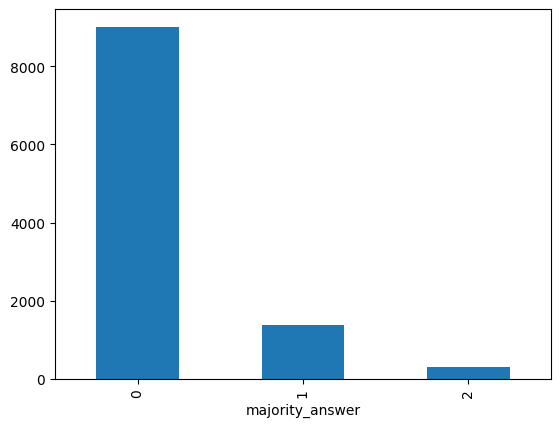

In [32]:
result_df_movies_final.groupby('majority_answer').majority_answer.value_counts().plot(kind='bar')

result_df_movies_final.to_csv('AmericanHistoryX_majority_annotated.csv')

## calculate ties

In [33]:
df_ties = df.drop_duplicates('movie_id')

In [34]:
df_ties.describe

<bound method NDFrame.describe of             workerId                                 movie_id    batch_id  \
0      AVNP1F3CADQRW                 AmericanHistoryX(1998)_1  1566624979   
1      AVNP1F3CADQRW                 AmericanHistoryX(1998)_2  1566624979   
2      AVNP1F3CADQRW                 AmericanHistoryX(1998)_3  1566624979   
3      AVNP1F3CADQRW                 AmericanHistoryX(1998)_4  1566624979   
4      AVNP1F3CADQRW                 AmericanHistoryX(1998)_5  1566624979   
...              ...                                      ...         ...   
9138  A2H1RXUC8XNNIW       TheWolfofWallStreet2013BluRay_3724  3859903933   
9139  A2H1RXUC8XNNIW       TheWolfofWallStreet2013BluRay_3725  3859903933   
9140  A2H1RXUC8XNNIW  TheWolfofWallStreet2013BluRay_3726_3727  3859903933   
9141  A2H1RXUC8XNNIW       TheWolfofWallStreet2013BluRay_3728  3859903933   
9142  A2H1RXUC8XNNIW  TheWolfofWallStreet2013BluRay_3729_3730  3859903933   

                                         

### calculate ties.percentage

In [35]:
df_ties.shape[0]

10688

In [36]:
len(movie_id_test)

80

In [37]:
len(movie_id_test) / df_ties.shape[0]

0.0074850299401197605

In [38]:
result_df_movies_final[(result_df_movies_final.batch_id==1566625003)][['text', 'majority_answer']]

,text,majority_answer
280,Gun! He's got a gun!,0
281,Shit! Back up!,1
282,You make me fucking sick!,1
283,Put down the fucking gun!,1
284,Shoot the nigger!,2
285,"Shoot him! Do it, Seth! Shoot him!",0
286,"Traitor! Do it, Seth! Do it!",0
287,Back up! Move!,0
288,Back up! Back the fuck up!,1
289,Move! Move!,0


In [39]:
df_ties[df_ties.movie_id.isin(movie_id_test)]

,workerId,movie_id,batch_id,text,answer,number,movie
368,A182N7RLXGSCZG,AmericanHistoryX(1998)_382_383,1566624988,Good. I hate Tabitha Soren and her Zionist MTV...,1,9,AmerricanHistoryX
498,AVNP1F3CADQRW,AmericanHistoryX(1998)_182,1566624983,Minorities don't give two shits about this cou...,1,19,AmerricanHistoryX
871,A4D99Y82KOLC8,AmericanHistoryX(1998)_1029,1566625003,Just shit. Got totally out of control.,2,32,AmerricanHistoryX
1209,A4D99Y82KOLC8,AmericanHistoryX(1998)_1088,1566625005,Bad-ass peckerwood with an attitude.,0,10,AmerricanHistoryX
2299,A182N7RLXGSCZG,AmericanHistoryX(1998)_351,1566624987,When was the last time you were actually able ...,1,20,AmerricanHistoryX
...,...,...,...,...,...,...,...
1830,AVNP1F3CADQRW,TheWolfofWallStreet2013BluRay_772,3859903872,"You're a bunch of fucking sleazy salesmen, right?",2,31,TheWolfofWallStreet
3618,A182N7RLXGSCZG,TheWolfofWallStreet2013BluRay_1472,3859903887,You think this is 'cause you're a fag?,1,19,TheWolfofWallStreet
3620,A182N7RLXGSCZG,TheWolfofWallStreet2013BluRay_1474,3859903887,And I go on vacation with him and his boyfrien...,1,21,TheWolfofWallStreet
8064,A182N7RLXGSCZG,TheWolfofWallStreet2013BluRay_3293,3859903924,"I'm Swiss, I'm not communist.",1,25,TheWolfofWallStreet


In [40]:
df_ties[df_ties.movie_id.isin(movie_id_test)].groupby('workerId').answer.value_counts()

workerId        answer
A13WYZ8AXD6ODX  2          5
                1          3
                0          2
A182N7RLXGSCZG  2         18
                1          6
                0          2
A1L1S0IAPZB4MO  2          4
A2H1RXUC8XNNIW  0         10
                1          6
                2          2
A2MAGMY4JMDD3V  1          1
A4D99Y82KOLC8   0          5
                1          1
                2          1
AVNP1F3CADQRW   1          9
                2          5
Name: count, dtype: int64

In [41]:
def get_percentage(answer, df):
    
    classifications = df[(df.answer==answer)].groupby('workerId').answer.value_counts().to_frame(name='total_classifications').reset_index('workerId')
    total_batches = df[(df.answer==answer)].drop_duplicates(subset=['batch_id', 'workerId']).groupby('workerId').batch_id.count().to_frame('total_batches').reset_index('workerId')
    
    merged_df = classifications.merge(total_batches, on='workerId')
    
    merged_df['number_dialogues'] = merged_df['total_batches'] * 40
    
    merged_df['percentage_as_' + str(answer)] = (merged_df['total_classifications'] / merged_df['number_dialogues'])
    
    merged_df.sort_values(by='number_dialogues' , ascending=False, inplace=True)
    return merged_df
    

In [42]:
get_percentage(0, df)

,workerId,total_classifications,total_batches,number_dialogues,percentage_as_0
5,A2H1RXUC8XNNIW,7116,213,8520,0.835211
1,A182N7RLXGSCZG,6451,198,7920,0.814520
11,A4D99Y82KOLC8,4743,138,5520,0.859239
12,AVNP1F3CADQRW,3570,113,4520,0.789823
0,A13WYZ8AXD6ODX,1380,40,1600,0.862500
6,A2MAGMY4JMDD3V,1272,39,1560,0.815385
10,A3E74I2YTGJCRF,634,22,880,0.720455
2,A1L1S0IAPZB4MO,128,16,640,0.200000
9,A32D8TKZV2RQ4Y,442,12,480,0.920833
8,A2V2ETRC6AO6GF,353,10,400,0.882500


In [43]:
get_percentage(1, df)

,workerId,total_classifications,total_batches,number_dialogues,percentage_as_1
5,A2H1RXUC8XNNIW,1100,192,7680,0.143229
1,A182N7RLXGSCZG,1071,181,7240,0.147928
11,A4D99Y82KOLC8,532,118,4720,0.112712
12,AVNP1F3CADQRW,726,109,4360,0.166514
6,A2MAGMY4JMDD3V,228,38,1520,0.150000
0,A13WYZ8AXD6ODX,112,36,1440,0.077778
10,A3E74I2YTGJCRF,206,22,880,0.234091
2,A1L1S0IAPZB4MO,367,15,600,0.611667
9,A32D8TKZV2RQ4Y,37,11,440,0.084091
8,A2V2ETRC6AO6GF,38,8,320,0.118750


In [44]:
get_percentage(2, df)

,workerId,total_classifications,total_batches,number_dialogues,percentage_as_2
1,A182N7RLXGSCZG,259,85,3400,0.076176
12,AVNP1F3CADQRW,194,77,3080,0.062987
5,A2H1RXUC8XNNIW,187,77,3080,0.060714
11,A4D99Y82KOLC8,145,59,2360,0.061441
0,A13WYZ8AXD6ODX,108,25,1000,0.108000
6,A2MAGMY4JMDD3V,60,19,760,0.078947
2,A1L1S0IAPZB4MO,110,15,600,0.183333
8,A2V2ETRC6AO6GF,9,6,240,0.037500
4,A2AA0GM76ENV5C,15,3,120,0.125000
10,A3E74I2YTGJCRF,5,3,120,0.041667


In [45]:
def get_fleiss_kappa(df, n, k):
    result = []
    annotation_all = []
    result_check = []
    df['answer'].replace({'hatespeech': 2, 'normal': 0, 'offensive': 1}, inplace=True)
    batch_ids = df.batch_id.unique()
    for batch_id in batch_ids:
        movie_ids = df[(df.batch_id==batch_id)].movie_id.unique()
        worker_ids = df[(df.batch_id==batch_id)].workerId.unique()
        
        annotation_singles = []
        for movie_id in movie_ids:
            annotation_single = df[(df.batch_id==batch_id) & (df.movie_id==movie_id)]
            f_k_single = [list(x) for x in annotation_single[['workerId', 'movie_id', 'answer']].values]
#             print(f_k_single)
#             break
            
            annotation_all.extend(f_k_single)
            annotation_singles.extend(f_k_single)
            result_check.append({'batch_id': str(batch_id), 'movie_id': movie_id, 'answer_1': f_k_single[0][2], 'answer_2': f_k_single[1][2],  'answer_3': f_k_single[2][2], 'worker_1': f_k_single[0][0], 'worker_2': f_k_single[1][0], 'worker_3': f_k_single[2][0]})
        # print(annotation_singles)
        ratingtask = agreement.AnnotationTask(annotation_singles)
        try:
            f_k= ratingtask.multi_kappa()
        except:
            f_k = 1
        result.append({'fleiss_kappa': f_k, 'batch_id': batch_id, 'worker_1': worker_ids[0], 'worker_2': worker_ids[1], 'worker_3': worker_ids[2]})
    result_df = pd.DataFrame(result)
    result_check_df = pd.DataFrame(result_check)
    return result_df, result_check_df, annotation_all

In [46]:
result_df, result_check_df, annotation_all = get_fleiss_kappa(df, n=3, k=3)

C:\Users\hp\AppData\Local\Temp\ipykernel_9708\896320585.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['answer'].replace({'hatespeech': 2, 'normal': 0, 'offensive': 1}, inplace=True)


In [31]:
result_df

,fleiss_kappa,batch_id,worker_1,worker_2,worker_3
0,0.350649,1566624979,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
1,0.485767,1566625000,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
2,0.929577,1566625009,A2V2ETRC6AO6GF,A182N7RLXGSCZG,AVNP1F3CADQRW
3,0.468385,1566624988,A182N7RLXGSCZG,A4D99Y82KOLC8,AVNP1F3CADQRW
4,0.343750,1566624983,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
...,...,...,...,...,...
266,0.916405,3859903929,A2MAGMY4JMDD3V,A182N7RLXGSCZG,A2H1RXUC8XNNIW
267,0.962512,3859903930,A182N7RLXGSCZG,A3E74I2YTGJCRF,A2H1RXUC8XNNIW
268,0.900000,3859903931,A2H1RXUC8XNNIW,A3E74I2YTGJCRF,A182N7RLXGSCZG
269,0.646465,3859903932,A182N7RLXGSCZG,A2H1RXUC8XNNIW,AVNP1F3CADQRW


In [47]:
result_df.fleiss_kappa.mean()

np.float64(0.509893361378852)

In [48]:
annotation_triples = [('A182N7RLXGSCZG', 'AmericanHistoryX(1998)_1405', 1), 
                       ('AVNP1F3CADQRW', 'AmericanHistoryX(1998)_1405', 1), 
                       ('A4D99Y82KOLC8', 'AmericanHistoryX(1998)_1405', 1)]

task = agreement.AnnotationTask(annotation_triples)

In [60]:
pip install scikit-learn


     ---------------------------------------- 11.1/11.1 MB 1.4 MB/s eta 0:00:00
     -------------------------------------- 41.2/41.2 MB 996.2 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [61]:
import sklearn
print(sklearn.__version__)  # To check if it's installed correctly


1.6.1


In [62]:
from sklearn.metrics import cohen_kappa_score
labeler1 = [1, 1, 0, 2]
labeler2 = [1, 1, 1, 1]
cohen_kappa_score(labeler1, labeler2)

np.float64(0.0)

In [67]:
from nltk import agreement

# Introduce variation in ratings to avoid division by zero
rater1 = [1, 1, 0]
rater2 = [1, 0, 1]
rater3 = [0, 1, 1]

# Create annotation task data: [rater_id, item_id, rating]
taskdata = [[0, str(i), str(rater1[i])] for i in range(len(rater1))] + \
           [[1, str(i), str(rater2[i])] for i in range(len(rater2))] + \
           [[2, str(i), str(rater3[i])] for i in range(len(rater3))]

# Create annotation task
ratingtask = agreement.AnnotationTask(data=taskdata)

# Calculate and print agreement metrics with error handling
try:
    print("Cohen's Kappa:", ratingtask.kappa())
    print("Fleiss' Kappa:", ratingtask.multi_kappa())
    print("Krippendorff's Alpha:", ratingtask.alpha())
    print("Scott's Pi:", ratingtask.pi())
except ZeroDivisionError:
    print("Error: Division by zero occurred. Try increasing data diversity.")


Cohen's Kappa: -0.5000000000000001
Fleiss' Kappa: -0.5000000000000001
Krippendorff's Alpha: -0.33333333333333326
Scott's Pi: -0.5000000000000001


In [68]:
result_check_df.head()

,batch_id,movie_id,answer_1,answer_2,answer_3,worker_1,worker_2,worker_3
0,1566624979,AmericanHistoryX(1998)_1,0,0,0,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
1,1566624979,AmericanHistoryX(1998)_2,1,1,1,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
2,1566624979,AmericanHistoryX(1998)_3,2,0,0,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
3,1566624979,AmericanHistoryX(1998)_4,0,0,0,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG
4,1566624979,AmericanHistoryX(1998)_5,0,0,0,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG


In [78]:
result_check_df.agreement.value_counts(normalize=True)

agreement
1.0                   0.812874
0.6666666666666666    0.179641
0.3333333333333333    0.007485
Name: proportion, dtype: float64

In [73]:
result_check_df['agreement'].value_counts(normalize=True)


agreement
1.000000    0.812874
0.666667    0.179641
0.333333    0.007485
Name: proportion, dtype: float64

In [74]:
result_check_df.columns = result_check_df.columns.str.strip()
print(result_check_df.columns)  # Verify column names again


Index(['batch_id', 'movie_id', 'answer_1', 'answer_2', 'answer_3', 'worker_1',
       'worker_2', 'worker_3', 'agreement'],
      dtype='object')


In [75]:
result_check_df['agreement'].value_counts(normalize=True)


agreement
1.000000    0.812874
0.666667    0.179641
0.333333    0.007485
Name: proportion, dtype: float64

In [76]:
print(result_check_df['agreement'].head())  # Show first few values
print(result_check_df['agreement'].dtype)   # Check the data type


0    1.000000
1    1.000000
2    0.666667
3    1.000000
4    1.000000
Name: agreement, dtype: float64
float64


In [77]:
result_check_df['agreement'] = result_check_df['agreement'].astype(str)


In [79]:
disagreement_movoie_id = []
def fx(x):
    row = result_check_df[result_check_df.movie_id==x]
    answer_1 = row.answer_1.values[0]
    answer_2 = row.answer_2.values[0]
    answer_3 = row.answer_3.values[0]
    movie_id = row.movie_id.values[0]
    
    
    a = [answer_1, answer_2, answer_3]
    b = {}
    for i in a:
        b[i] = b.get(i, 0) + 1
    sorted_dict = dict(sorted(b.items()))
    number = list(sorted_dict.values())[0]
    
    if number == 3:
        result = 1  
    elif len(sorted_dict) == 3:
        result = 1/3
        disagreement_movoie_id.append(movie_id)
    else:
        result = 2/3
    return result

result_check_df['agreement'] = result_check_df.movie_id.apply(fx)

In [81]:
agreement_result = result_check_df['agreement'].value_counts().to_frame(name='count')
agreement_result['percentage'] = agreement_result['count'] / agreement_result['count'].sum()


In [82]:
agreement_result.reset_index().rename(columns={'index': 'percentage_they_do_agree'})

,agreement,count,percentage
0,1.000000,8688,0.812874
1,0.666667,1920,0.179641
2,0.333333,80,0.007485


In [83]:
result_check_df[result_check_df.movie_id.isin(disagreement_movoie_id)]

,batch_id,movie_id,answer_1,answer_2,answer_3,worker_1,worker_2,worker_3,agreement
128,1566624988,AmericanHistoryX(1998)_382_383,1,0,2,A182N7RLXGSCZG,A4D99Y82KOLC8,AVNP1F3CADQRW,0.333333
178,1566624983,AmericanHistoryX(1998)_182,1,0,2,AVNP1F3CADQRW,A4D99Y82KOLC8,A182N7RLXGSCZG,0.333333
311,1566625003,AmericanHistoryX(1998)_1029,2,1,0,A4D99Y82KOLC8,AVNP1F3CADQRW,A182N7RLXGSCZG,0.333333
409,1566625005,AmericanHistoryX(1998)_1088,0,2,1,A4D99Y82KOLC8,AVNP1F3CADQRW,A182N7RLXGSCZG,0.333333
779,1566624987,AmericanHistoryX(1998)_351,1,0,2,A182N7RLXGSCZG,AVNP1F3CADQRW,A4D99Y82KOLC8,0.333333
...,...,...,...,...,...,...,...,...,...
8255,3859903872,TheWolfofWallStreet2013BluRay_772,2,0,1,AVNP1F3CADQRW,A182N7RLXGSCZG,A2H1RXUC8XNNIW,0.333333
8843,3859903887,TheWolfofWallStreet2013BluRay_1472,1,0,2,A182N7RLXGSCZG,A32D8TKZV2RQ4Y,A2H1RXUC8XNNIW,0.333333
8845,3859903887,TheWolfofWallStreet2013BluRay_1474,1,0,2,A182N7RLXGSCZG,A32D8TKZV2RQ4Y,A2H1RXUC8XNNIW,0.333333
10329,3859903924,TheWolfofWallStreet2013BluRay_3293,1,0,2,A182N7RLXGSCZG,A2H1RXUC8XNNIW,A3E74I2YTGJCRF,0.333333


In [84]:
def get_charts(df):
    df['answer_1'].replace({0: 1, 1: 2, 2: 3}, inplace=True)
    df['answer_2'].replace({0: 1, 1: 2, 2: 3}, inplace=True)
    df['answer_3'].replace({0: 1, 1: 2, 2: 3}, inplace=True)
    for batch_id in df.batch_id.unique():
        w_1, w_2, w_3 = df[df.batch_id==batch_id][['worker_1', 'worker_2', 'worker_3']].values[0] 
        title = 'batch_id: ' + str(batch_id) + '_' + 'w_1: ' + w_1 + '_' +  'w_2: ' + w_2 + '_' +  'w_3: ' + w_3
        df[df.batch_id==batch_id].plot(kind='bar', stacked=True, title=title)

C:\Users\hp\AppData\Local\Temp\ipykernel_9708\3893960580.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['answer_1'].replace({0: 1, 1: 2, 2: 3}, inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_9708\3893960580.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exa

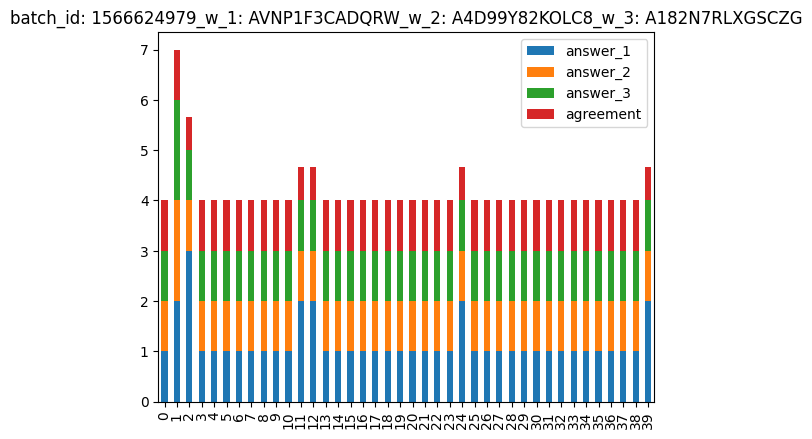

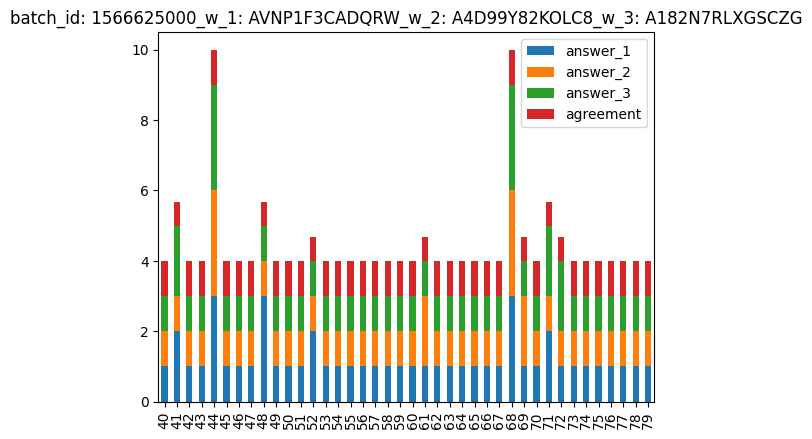

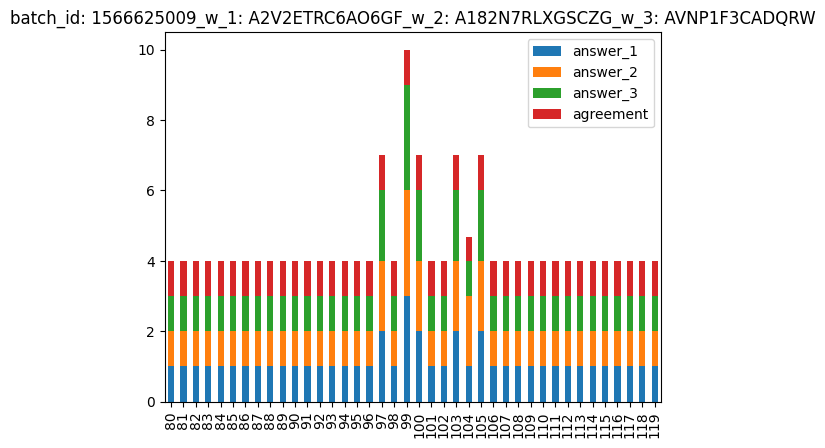

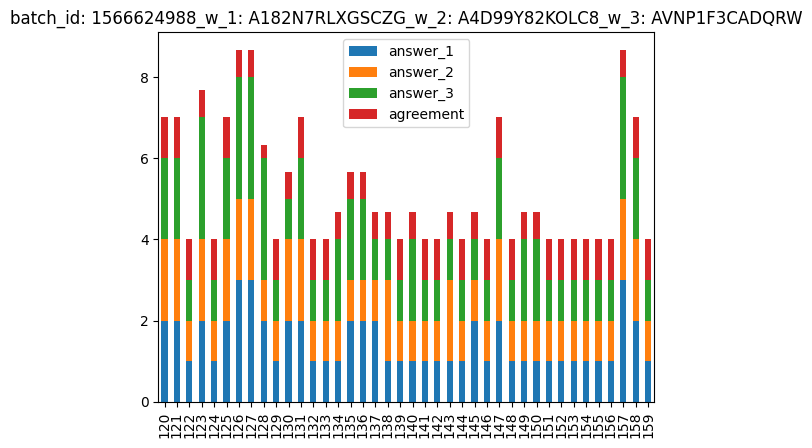

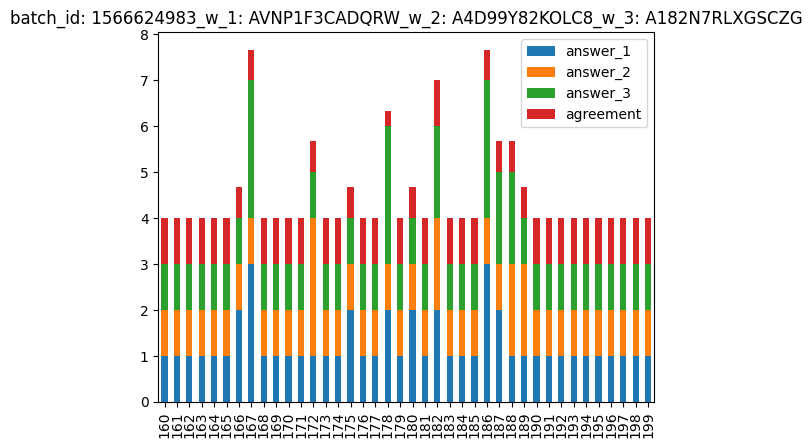

...

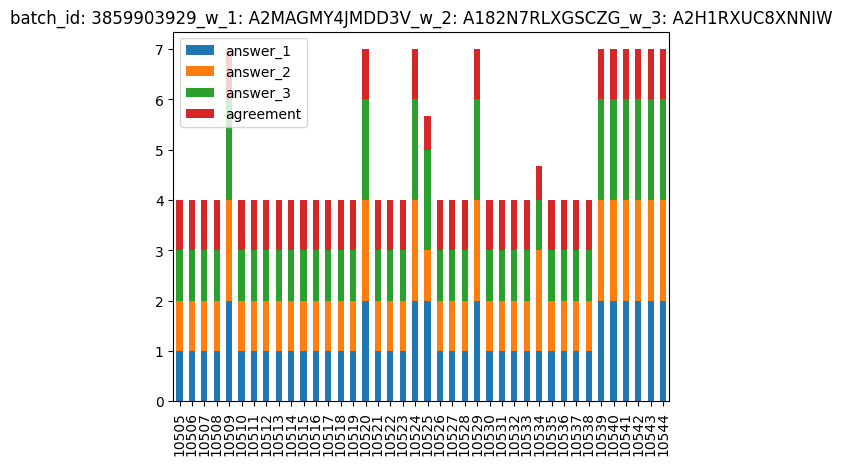

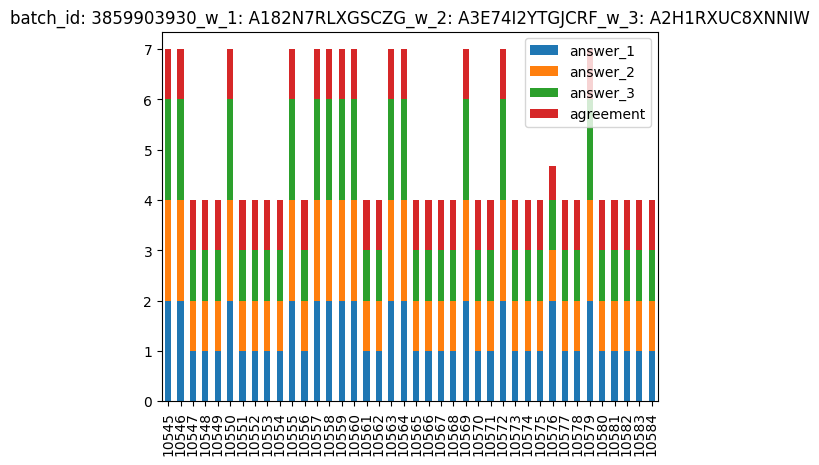

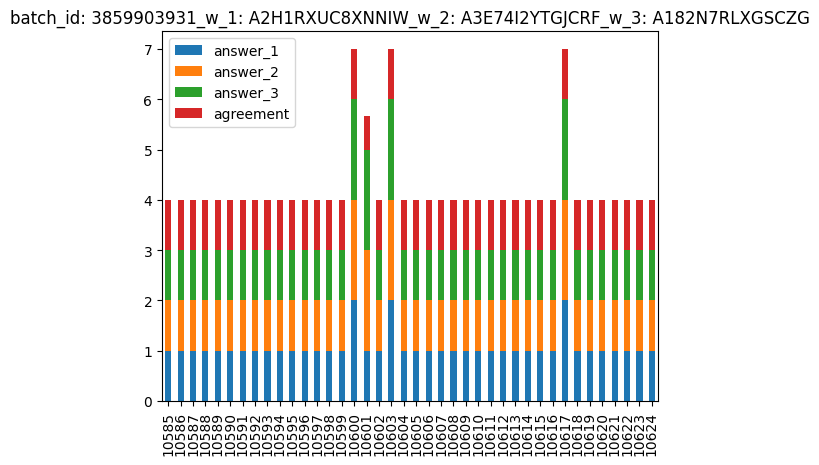

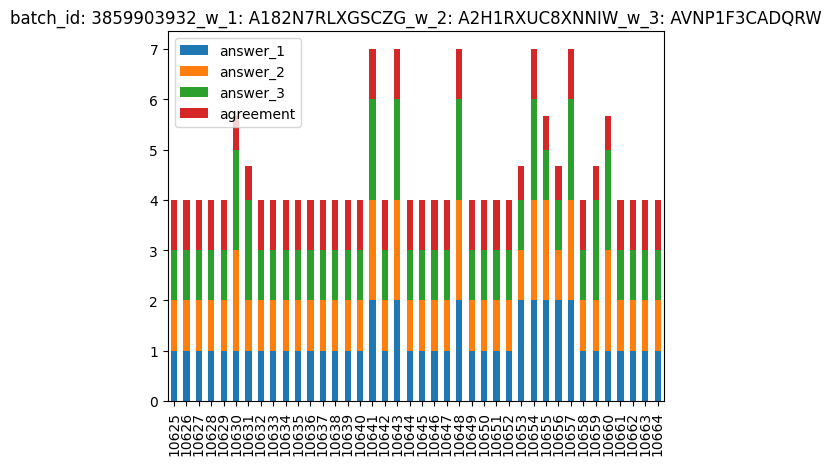

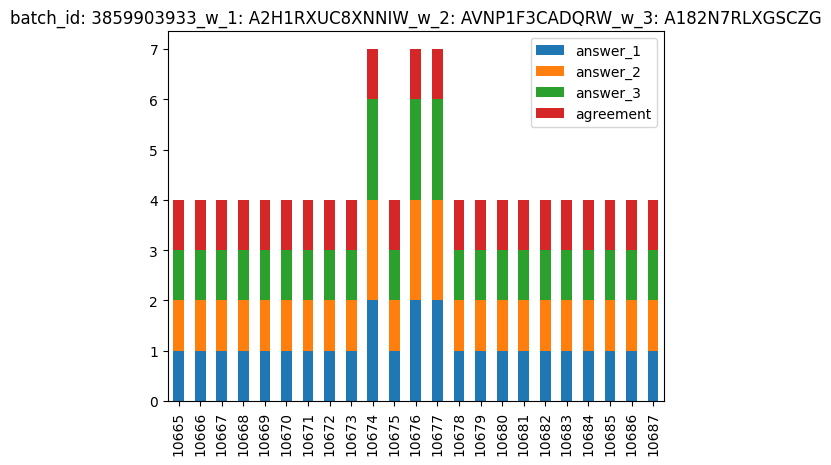

In [85]:
get_charts(result_check_df)